<a href="https://colab.research.google.com/github/Dimildizio/VehicleClassifier/blob/main/Vehicle_count.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and set up

In [ ]:
from IPython import display

In [ ]:
#!pip install ffmpeg
!pip install onnx
!pip install onnxruntime-gpu
!pip install supervision==0.1.0
!pip install tensorrt
!pip install thop
!pip install ultralytics

display.clear_output()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 49.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 592.7/592.7 kB 8.9 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
import os
import supervision
import sys
import torch
import tensorrt as trt
import ultralytics


from dataclasses import dataclass
from google.colab.patches import cv2_imshow
from IPython import display
from moviepy.editor import VideoFileClip
from supervision.draw.color import ColorPalette
from supervision.geometry.dataclasses import Point
from supervision.notebook.utils import show_frame_in_notebook
from supervision.tools.detections import Detections, BoxAnnotator
from supervision.tools.line_counter import LineCounter, LineCounterAnnotator
from supervision.video.dataclasses import VideoInfo
from supervision.video.source import get_video_frames_generator
from supervision.video.sink import VideoSink
from tqdm.notebook import tqdm
from ultralytics import YOLO

In [ ]:
HOME = os.getcwd()
VIDEO_LOCATION = f"{HOME}/my_street_truck.avi"

In [ ]:
%matplotlib inline

## Check if all set up - yolo and cuda

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.0.110 🚀 Python-3.10.11 torch-2.0.1+cu118 CPU
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.3/107.7 GB disk)


In [ ]:
torch.cuda.is_available()

False

In [ ]:
! nvidia-smi

/bin/bash: nvidia-smi: command not found


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

#### Download necessary files

In [ ]:
!wget -O /content/structure.png https://raw.githubusercontent.com/Dimildizio/VehicleClassifier/main/pictures/structure.png
!wget -O /content/model_comparison.png https://raw.githubusercontent.com/Dimildizio/VehicleClassifier/main/pictures/model_comparison.png
!wget -O /content/YOLO_concept.png https://raw.githubusercontent.com/Dimildizio/VehicleClassifier/main/pictures/YOLO_order.png
!wget -O /content/bytetrack_comparison.png https://raw.githubusercontent.com/Dimildizio/VehicleClassifier/main/pictures/byterack.png
!wget -O /content/yolovXexample.avi https://github.com/Dimildizio/VehicleClassifier/raw/main/video_data/processed_video/yoloXexample.avi
!wget -O /content/mobilenet_example.avi https://github.com/Dimildizio/VehicleClassifier/raw/main/video_data/processed_video/mobilenet_street.avi
!wget -O /content/my_street_truck.avi https://github.com/Dimildizio/VehicleClassifier/raw/main/video_data/raw_video/my_street_truck.avi


display.clear_output()

##Play video in google colab

Showing videos in google colab is no trivial job. I tried cv2 inbuilt but it just prints frame after frame in a row.

Tried with display.clear_output() and timer but it keeps clearing (well duh!) the output block.

IPython.display.Video gave me some hope and even created a player but it didn't run. First I though it was not compatible with .avi and made another video converting it to .mp4 but that didn't run as well.

So the last effort was using moviepy module and compiling the video on the go. Works for short video but will not work for longer videos or a live stream.

In [ ]:
clip = VideoFileClip(VIDEO_LOCATION)
display.display(clip.ipython_display())
clip.close()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# Project structure

# Model

## Model comparison

## Load YOLO model

In [ ]:
MODEL_S = "yolov8s.pt"
MODEL_X = "yolov8x.pt"

In [ ]:
model = YOLO(MODEL_S)
model.fuse()
model.to(device)

100%|██████████| 21.5M/21.5M [00:00<00:00, 125MB/s] 
YOLOv8s summary (fused): 168 layers, 11156544 parameters, 0 gradients, 28.6 GFLOPs


In [ ]:
def apply_model(model, frame):
  result = model(frame)
  worked_frame = result[0].plot()
  return worked_frame

In [ ]:
! nvidia-smi

/bin/bash: nvidia-smi: command not found


## Get one frame from a video

In [ ]:
FRAME_NUM_TO_USE = 55

Number of frames 312



0: 480x640 1 person, 7 cars, 1 bus, 958.9ms
Speed: 24.6ms preprocess, 958.9ms inference, 32.0ms postprocess per image at shape (1, 3, 640, 640)


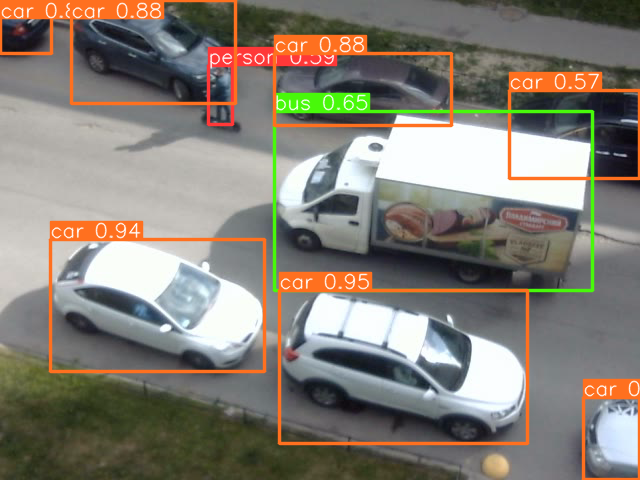

In [ ]:
cap = cv2.VideoCapture(VIDEO_LOCATION)
print('Number of frames', int(cap.get(cv2.CAP_PROP_FRAME_COUNT)))

#to get to a certain (FRUME_NUM_TO_USE) frame
for _ in range(FRAME_NUM_TO_USE):
  works, frame = cap.read()
  if not works:
    break

myframe = apply_model(model, frame)
cv2_imshow(myframe)  #for local machine cv2.imshow('Frame', myframe)

cap.release()

Pretty neat but we don't really need class "person".

The following code works well detecting objects on the video (Although a bit slow on CPU compared to what can be achieved with ssdlite mobilenet and cv2).

Another problem is that google colab really doesn't like playing videos.

Now time to use object detection on the video feed.

In [ ]:
def make_inf(model, output = 'detected_video_s.avi')
  cap = cv2.VideoCapture(VIDEO_LOCATION)

  size = int(cap.get(3)), int(cap.get(4))
  orig_fps = cap.get(cv2.CAP_PROP_FPS)
  worse_fps_times = 5
  new_fps = orig_fps / worse_fps_times

  fourcc = cv2.VideoWriter_fourcc(*'MJPG')
  video_out = cv2.VideoWriter(output, fourcc, new_fps, size)

  #pick every nth frame so it would lower the frame rate nth-fold
  nth_frame = 0
  while cap.isOpened():
    works, frame = cap.read()
    if not works:
      break
    if cv2.waitKey(1) & 0xFF == ord('q'):
      break
    if nth_frame % worse_fps_times == 0:
      detected = apply_model(model, frame)
      video_out.write(detected)
    nth_frame +=1

  cap.release()
  video_out.release()
  cv2.destroyAllWindows()
  display.clear_output()

In [ ]:
s_model = YOLO('yolov8s.pt')
model = YOLO(MODEL)
model.fuse()
model.to(device)
s_name = "detected_video_s.avi"
make_inf(model)

In [ ]:
clip = VideoFileClip(s_name) #, fps = 30/2)
display.display(clip.ipython_display())
clip.close()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


No wonder yolo s(mall) performs 5 times faster but sometimes missclassifies objects. (l)arge model is better but slower and even on video it missclassified objects as well.

### So here is the video with detection. From here we can take several approaches:


####1. We can record a whole-day video and process it this this way and just counting the cars and trucks that pass by.


####2. We can proceed working with live feed

#### 3. We can just count the number of cars each second (not each frame). One second is enough for a car to pass through the area.

Option 3 is a no-brainer and a lazy way to solve the problem. 
Options 1 and 2 require a tracking system implemented.

Since all true heroes always go around we drop option 3 which leaves us with 1 and 2. 
Let's proceed with "video" approach and see later if we could refactor it to work with camera live feed as well.

### What are the caveats and edgecases?

1. There are cars parked at this area. They shouldn't be counted.
2. There could be traffic jams and vehicles could move slowers than usual
3. Live stream requires always having access to the camera. 
4. For live feed the main problem is the speed yolo detects objects. With added tracking it might get even slower but we might need a way to optimize YOLO (yolo-ONNX-TensorTR) 
5. Google colab isn't friendly to video and even less friendly to live feed
6. If we take the "prerecorded video" approach it requires double time - first to record the video and then to process it.

##Optimization

On deploy YOLO is supposed to work faster and be optimize being converted to ONNX first and then to TensorRT.

Unfortunatelly due to the lack of time and resource limits of free version of colab GPU we won't continue further with optimization and trying to run

###ONNX 
ONNX is standard format for representing neural nets. It is used to convert and be able to use the models in different frameworks like torch, tensorflow, etc. 

There is also an nice website that allows to take a glimpse at the model structure - netron.app

(In our case it's a very long structure that consists of name convolutions with a deciding MLP head

In [ ]:
onnx_model = model.export(format = 'onnx')

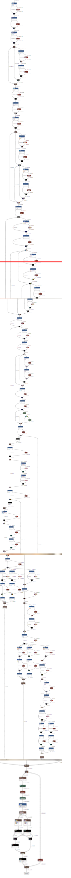

### TenosrRT

Deploying the model using TensorRT might give about x2 speed boost over usual model on GPU 

In [ ]:
rt_model = model_x.export(format='TensorRT', verbose=True, device=0, half=True, opset=12, workspace=30)
rt_name = "yolov8x.engine"

In [ ]:
'''with open(rt_name,"rb") as fb:
    serialized_engine = fb.read()

logger = trt.Logger(trt.Logger.WARNING)
runtime = trt.Runtime(logger)
de_engine = runtime.deserialize_cuda_engine(serialized_engine)
print(type(de_engine))'''

'with open(rt_name,"rb") as fb:\n    serialized_engine = fb.read()\n\nlogger = trt.Logger(trt.Logger.WARNING)\nruntime = trt.Runtime(logger)\nde_engine = runtime.deserialize_cuda_engine(serialized_engine)\nprint(type(de_engine))'

To my regret I didn't manage to deserialize .engine type to make it usable. Another attempt has been made by using it through uploading using YOLO

In [ ]:
model_rt = YOLO(rt_name)

In [ ]:
tr_predicted= model.predict(frame)

Using YOLO model has been able to predict but I didn't manage to figure out how to show those predictions on screen using cv2_imshow and converting to numpy array didn't help.

# Tracking

First we need to pick a tracking model. Judging by these [papers](https://www.arxiv-vanity.com/papers/2110.06864) ByteTracker is our go-to option do to it's speed and non-complex tracking.

#### For tracking we need to install ByteTrack and other necessary things like onnx

In [ ]:
%cd {HOME}
!git clone https://github.com/ifzhang/ByteTrack.git
%cd {HOME}/ByteTrack

!sed -i 's/onnx==1.8.1/onnx==1.9.0/g' requirements.txt

!pip3 install -q -r requirements.txt
!python3 setup.py -q develop
!pip install -q cython_bbox
!pip install -q onemetric
!pip install -q loguru lap

sys.path.append(f"{HOME}/ByteTrack")

display .clear_output()

In [ ]:
import yolox
from yolox.tracker.byte_tracker import BYTETracker, STrack
from onemetric.cv.utils.iou import box_iou_batch

####Check installed versions of yolox and supervision

In [ ]:
print("yolox.__version__:", yolox.__version__)
print("supervision.__version__:", supervision.__version__)

## Get class names and ids

This are the actual classes we track

In [ ]:
MODEL_CLASS_NAMES = model.model.names
#We need person, bicycle, car, motocycle, bus and truck 
CLASS_ID_REQ = [0, 1, 2, 3, 5, 7]

## Perform object tracking

But we need more than simply detect objects. We want to count them. And to make sure we don't count the same object multiple times we need to learn how to track

####Create a class for arguments of the tracker

In [ ]:
#These are taken from the tutorial and I didn't change anything here
@dataclass(frozen=True)
class BYTETrackerArgs:
    track_thresh: float = 0.25
    track_buffer: int = 30
    match_thresh: float = 0.8
    aspect_ratio_thresh: float = 3.0
    min_box_area: float = 1.0
    mot20: bool = False

To use tracking and predicted values together we need to write some utilities

In [ ]:
# Construct detection instance
def get_detections(result):
  detection = Detections(
                xyxy=result[0].boxes.xyxy.cpu().numpy(),
                confidence=result[0].boxes.conf.cpu().numpy(),
                class_id=result[0].boxes.cls.cpu().numpy().astype(int))
  return detection

#label detected objects
def get_labels(detections, tracker = True):
  labels = [f"{'#'+str(tracker_id)+ ' ' if tracker else ''}{MODEL_CLASS_NAMES[class_id]} {conf:0.2f}"
            for _, conf, class_id, tracker_id in detections]
  return labels

# Filter unwanted classes with bool mask
def filter_detections(detections, class_objects = CLASS_ID_REQ):
  mask = np.array([class_id in class_objects for class_id in detections.class_id], dtype = bool)
  dets = detections.filter(mask=mask, inplace=False)
  return dets

# Create bool mask to filter empty track_id
def filter_empty_tracks(detections):
  mask = np.array([tracker_id is not None for tracker_id in detections.tracker_id], dtype=bool)
  dets = detections.filter(mask=mask, inplace=False)
  return dets

In [ ]:
# Convert detected to ndarray
def detections2boxes(detections) -> np.ndarray:
    return np.hstack((detections.xyxy, detections.confidence[:, np.newaxis]))

In [ ]:
# Conver trackings to ndarray
def tracks2boxes(tracks) -> np.ndarray:
    return np.array([track.tlbr for track in tracks], dtype=float)

In [ ]:
# Make them work together
def match_detections_with_tracks(detections, tracks):
   
    if not np.any(detections.xyxy) or len(tracks) == 0:
        return np.empty((0,))                           #if nothing has been detected

    tracks_boxes = tracks2boxes(tracks=tracks)          #track->ndarray
    iou = box_iou_batch(tracks_boxes, detections.xyxy)  #get highest Intersect over Union of tracks and detections
    track2detection = np.argmax(iou, axis=1)            #get the highest predictions for each class
    
    tracker_ids = [None] * len(detections)              #init ids (nones for now)
    
    #match detections with tracker ids
    for tracker_index, detection_index in enumerate(track2detection):
        if iou[tracker_index, detection_index] != 0:
            tracker_ids[detection_index] = tracks[tracker_index].track_id

    return tracker_ids

#### For tracker and yolo annotating is a bit more complex than just results[0].plot() we need a generator that gives us one frame from a video which we label and annotate

In [ ]:
frame_generator = get_video_frames_generator(VIDEO_LOCATION)

Create an annotator

In [ ]:
BOX_ANNOTATOR = BoxAnnotator(color=ColorPalette(), thickness=2, text_thickness=1, text_scale=0.5)

Now get the first frame from the video and predict it

In [ ]:
iterator = iter(frame_generator)
frame_to_predict = next(iterator)
for x in range(50):
  frame_to_predict = next(iterator)
#predict
result = model(frame_to_predict)


0: 480x640 1 person, 7 cars, 1 truck, 793.0ms
Speed: 17.2ms preprocess, 793.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Convert to detections class of supervision lib

In [ ]:
detections = get_detections(result)

Create labels and annotate objects with them

In [ ]:
filtered_list = []
for obj_box, percent, class_id, tracker in detections:
  
  if class_id in CLASS_ID_REQ:
    filtered_list.append([obj_box, percent, class_id, tracker])
    print(obj_box, percent, class_id, tracker)

[     279.43      290.28      527.62      443.18] 0.95354366 2 None
[     50.767      238.96      264.57      371.68] 0.944247 2 None
[     71.239           0      236.64      102.65] 0.8996673 2 None
[     274.99      53.678       452.1      138.17] 0.88121367 2 None
[    0.22093     0.15313      51.653       53.97] 0.87613827 2 None
[     582.97       397.2      639.63      479.65] 0.8368408 2 None
[     332.47      122.26      639.35      301.12] 0.71525794 7 None
[     237.63      72.438      262.17      131.35] 0.61750185 0 None
[     505.92      91.229      639.45      149.44] 0.41096473 2 None


In [ ]:
#[f"{MODEL_CLASS_NAMES[class_id]} {percent:0.2f}" for _, percent, class_id, __ in filtered_list]# if (percent > 0.5 and class_id in CLASS_ID_REQ)]
labels = get_labels(filtered_list, False)

In [ ]:
print(labels)

['car 0.95', 'car 0.94', 'car 0.90', 'car 0.88', 'car 0.88', 'car 0.84', 'truck 0.72', 'person 0.62', 'car 0.41']


In [ ]:
next_frame = BOX_ANNOTATOR.annotate(frame=frame_to_predict, detections=filtered_list, labels=labels)

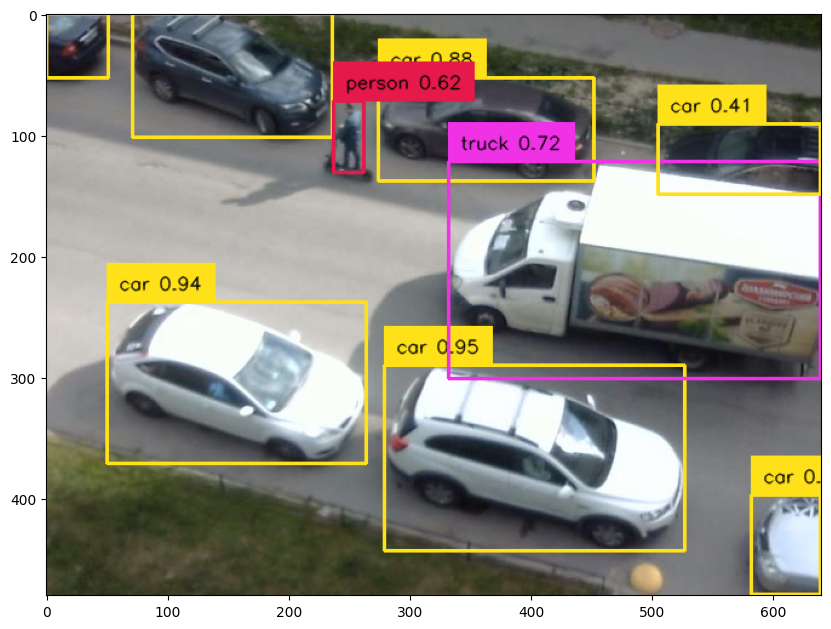

In [ ]:
show_frame_in_notebook(next_frame, (10, 10))

### Counting line
Let's draw a line which will count objects that cross it

In [ ]:
LINE_START = Point(150, 0)
LINE_END = Point(0, 480)
line_counter = LineCounter(start=LINE_START, end=LINE_END)
LINE_ANNOTATOR = LineCounterAnnotator(thickness=2, text_thickness=1, text_scale=0.5)

# Putting it all together

###Gather everything together for one frame

Lets combine all funcs together to make sure it works as one

In [ ]:
def predict_n_annotate(next_frame):
  result = model.predict(next_frame)

  detections = Detections(
    xyxy=result[0].boxes.xyxy.cpu().numpy(),
    confidence=result[0].boxes.conf.cpu().numpy(),
    class_id=result[0].boxes.cls.cpu().numpy().astype(int))

  objects = [detected_obj for detected_obj in detections if detected_obj[2] in CLASS_ID_REQ]
  labels = [f"{MODEL_CLASS_NAMES[class_id]} {conf:0.2f}" for _, conf, class_id, __ in objects]
  annotated_frame = BOX_ANNOTATOR.annotate(frame=next_frame, detections=objects, labels=labels)
  LINE_ANNOTATOR.annotate(frame=annotated_frame, line_counter=line_counter)  #inplace
  show_frame_in_notebook(annotated_frame, (10, 10))
  return annotated_frame


0: 480x640 1 person, 7 cars, 1 bus, 434.4ms
Speed: 4.0ms preprocess, 434.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


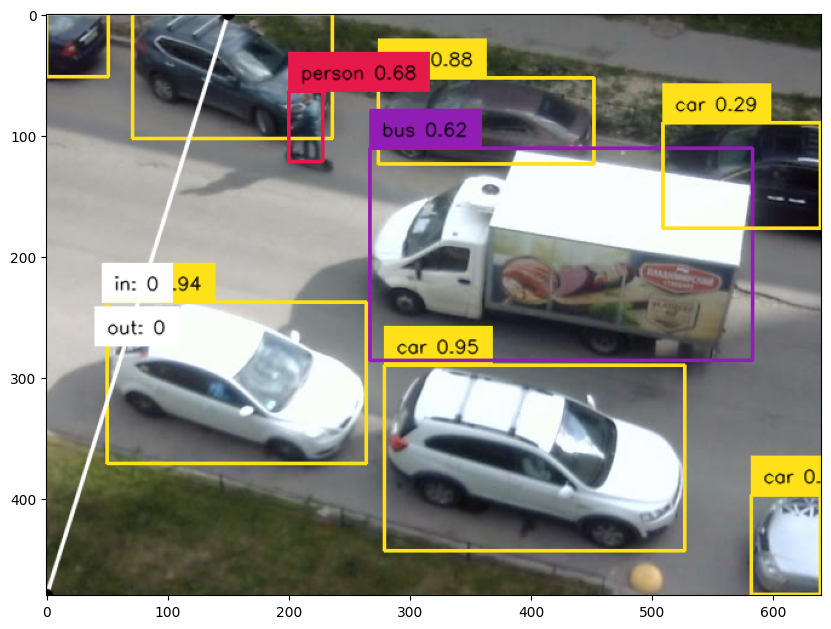

In [ ]:
#on the same unexhausted generator
another_frame = predict_n_annotate(next(iterator))

## Write tracking

#### Create path for output video and an info instance of a video we work with

In [ ]:
TRACKING_VIDEO = f'{HOME}/tracking_video.avi'

In [ ]:
video_info = VideoInfo.from_video_path(VIDEO_LOCATION)

#### Create tracker, annotator and a line

In [ ]:
BYTE_TRACKER = BYTETracker(BYTETrackerArgs())
frame_generator = get_video_frames_generator(VIDEO_LOCATION)

LINE_START = Point(380, 0)
LINE_END = Point(200, 480)
LINE_COUNTER = LineCounter(start=LINE_START, end=LINE_END)

TRUCKLINE_START = Point(180, 0)
TRUCKLINE_END = Point(0, 480)
TRUCKLINE_COUNTER = LineCounter(start=TRUCKLINE_START, end=TRUCKLINE_END)


box_ann = BoxAnnotator(color=ColorPalette(), thickness=1, text_thickness=1, text_scale=0.5)
line_ann = LineCounterAnnotator(thickness=2, text_thickness=1, text_scale=0.5)
truck_line_ann = LineCounterAnnotator(thickness=2, text_thickness=1, text_scale=0.5)

###Frame by frame inference and tracking objects then writing to a file

In [ ]:
def track_n_line(result, line = LINE_COUNTER, filters = CLASS_ID_REQ):
    detections = filter_detections(get_detections(result), filters)

    tracks = BYTE_TRACKER.update(
        output_results = detections2boxes(detections=detections),
        img_info=frame.shape, img_size=frame.shape)
    tracker_id = match_detections_with_tracks(detections, tracks)
    
    detections.tracker_id = np.array(tracker_id)
    detections = filter_empty_tracks(detections) 
    labels = get_labels(detections)

    line.update(detections = detections) 
    return detections, labels

In [ ]:
with VideoSink(TRACKING_VIDEO, video_info) as sink:
  for frame in tqdm(frame_generator, total=video_info.total_frames):
    model_result = model(frame)

    model_detections, labels = track_n_line(model_result)

    trucks = filter_detections(model_detections, [6,7])
    TRUCKLINE_COUNTER.update(detections = trucks)

    frame = box_ann.annotate(frame=frame, detections=model_detections, labels=labels)
    line_ann.annotate(frame=frame, line_counter=LINE_COUNTER)

    truck_line_ann.annotate(frame=frame, line_counter=TRUCKLINE_COUNTER) 

    sink.write_frame(frame)

  0%|          | 0/312 [00:00<?, ?it/s]


0: 480x640 7 cars, 457.0ms
Speed: 3.4ms preprocess, 457.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 447.6ms
Speed: 3.0ms preprocess, 447.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 433.6ms
Speed: 3.0ms preprocess, 433.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 446.7ms
Speed: 3.1ms preprocess, 446.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 437.8ms
Speed: 2.6ms preprocess, 437.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 455.8ms
Speed: 3.0ms preprocess, 455.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 430.2ms
Speed: 2.8ms preprocess, 430.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 7 cars, 458.5ms
Speed: 3.2ms preprocess, 458.5ms inference, 1.4ms postprocess per image at shape (1, 3, 64

In [ ]:
clip = VideoFileClip(TRACKING_VIDEO) 
display.display(clip.ipython_display())
clip.close()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
print('Objects total:', LINE_COUNTER.out_count + LINE_COUNTER.in_count)
print('Trucks:', TRUCKLINE_COUNTER.out_count + TRUCKLINE_COUNTER.in_count)

Objects total: 5
Trucks: 1
